#### Data Pipeline to label historical price data and prepare the data set for classification

In [40]:
# imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pandas_datareader as pdr
import datetime
import seaborn
plt.style.use('seaborn-pastel')

import warnings
warnings.filterwarnings('ignore')

In [15]:
'''
Function to load price data from disk 
'''
def load_data(symbol,years,path):
    
    for count,year in enumerate(years):
        if count == 0:
            df = pd.read_csv(path + '/' + str(year) + '/' + symbol + '.csv')
        else:
            df = pd.concat([df,pd.read_csv(path + '/' + str(year) + '/' + symbol + '.csv')]) 
    
    df = df.reset_index(drop=True)
    
    return df

In [16]:
'''
Helper method to calculate Exponential Moving Average
'''
def get_ema(df,span):
    sma = df.rolling(window=span, min_periods=span).mean()[:span]
    rest = df[span:]
    ema = pd.concat([sma, rest]).ewm(span=span, adjust=False).mean()
    return ema

In [17]:
'''
Method to add moving average crossover signals. 
The crossover signals will establish the starting search points when finding 
the local minimums and local maximums to label the up and down trends 
'''
def get_signals(price_df):
    short_window = 10

    signals = pd.DataFrame(index=price_df.index)
    signals['signal'] = 0.0

    # calculate moving averages
    signals['sma10'] = price_df['Close'].rolling(window=short_window).mean()
    signals['ema20'] = get_ema(price_df['Close'],20)
    signals['ema30'] = get_ema(price_df['Close'],30)

    # add signals when moving averages cross
    signals['signal'][short_window:] = \
    np.where(signals['sma10'][short_window:] > signals['ema30'][short_window:], 1.0, 0.0) 

    # add positions when signals change
    signals['positions'] = signals['signal'].diff()

    # add inflection points and pivot points
    signals['inflection'] = 0.0
    signals['pivot'] = 0.0

    # add prices to signals
    signals['price'] = price_df['Close']
    
    return signals

In [18]:
'''
Method to label the local minimums and maximums for up and down trends
'''
def get_best(signals):  
    temp = signals
    start = signals.index[0]
    end = start
    key = start

    # find best inflection points
    for index,row in signals.iterrows():
        if row['positions'] == 1:
            end = index
            inflection = temp['price'][start:end].min()
            temp['inflection'][start:end] = inflection
            temp['pivot'][start:end] = np.where(temp['price'][start:end] == inflection, 1, 0)
            start = end  
        if row['positions'] == -1:
            end = index
            inflection = temp['price'][start:end].max()
            temp['inflection'][start:end] = inflection
            temp['pivot'][start:end] = np.where(temp['price'][start:end] == inflection, -1, 0)
            start = end

    signals['pivot'] = temp['pivot']
    best = signals
    best['signal'] = 0.0

    # add signals for best inflection points
    current_signal = 0.0
    for index,row in best.iterrows():
        if row['pivot'] == 1:
            current_signal = 1.0
        if row['pivot'] == -1:
            current_signal = 0.0
        row['signal'] = current_signal
        
    return best

In [31]:
'''
Plot signals to visually confirm the local minimums and maximums are correct
'''
def plot_signals(symbol, signals):
    fig = plt.figure(figsize=(15,10))

    ax1 = fig.add_subplot(111,ylabel='Price')

    ax1.plot(price_df['Close'], color='black')

    # signals[['sma10', 'ema20', 'ema30']].plot(ax=ax1)
    ax1.plot(signals['sma10'], color='orange')
    ax1.plot(signals['ema20'], color='blue')
    ax1.plot(signals['ema30'], color='green')

    # plot buys
    ax1.plot(signals.loc[signals.positions == 1.0].index, \
             signals.sma10[signals.positions == 1.0], '^', markersize=15, color='g')

    # plot sells
    ax1.plot(signals.loc[signals.positions == -1.0].index, \
             signals.sma10[signals.positions == -1.0], 'v', markersize=15, color='r')

    # plot best buys
    ax1.plot(signals.loc[signals['pivot'] == 1.0].index, \
             signals.price[signals['pivot'] == 1.0], '^', markersize=15, color='b')

    # # plot best sells
    ax1.plot(signals.loc[signals['pivot'] == -1.0].index, \
             signals.price[signals['pivot'] == -1.0], 'v', markersize=15, color='b')

    plt.title(symbol + ' Price History')

    plt.show()
    
'''
Save labeled data for training
'''
def save_results(symbol, price_df, best):
    filepath = "/Users/steve/coinpix/labeled-data/" + symbol + '.csv'
    columns=['symbol','Date','High','Low','Open','Close','signal']
    full_df = pd.concat([price_df, best], axis=1)[columns]
    full_df.to_csv(filepath)    

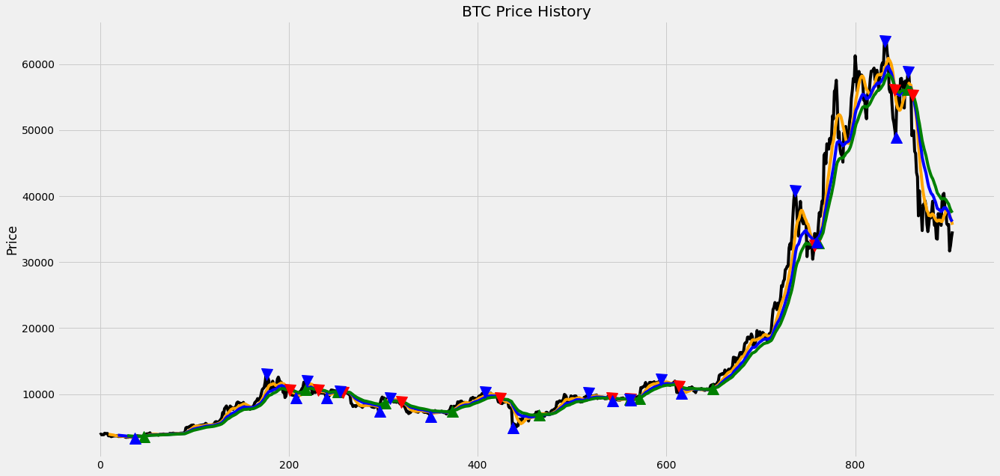

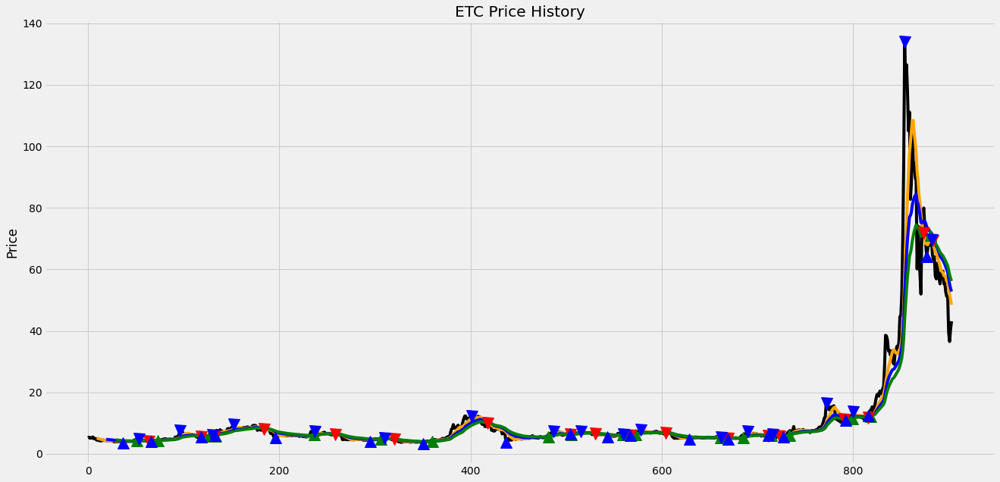

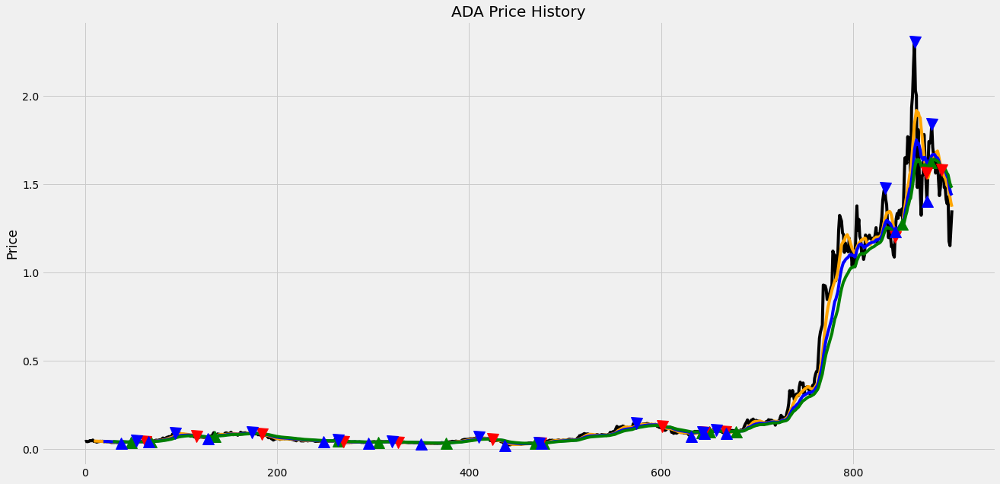

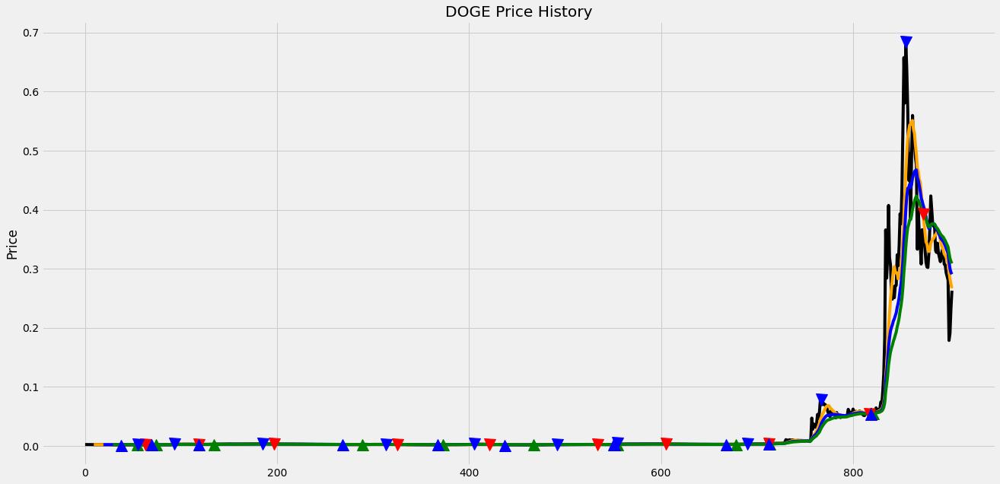

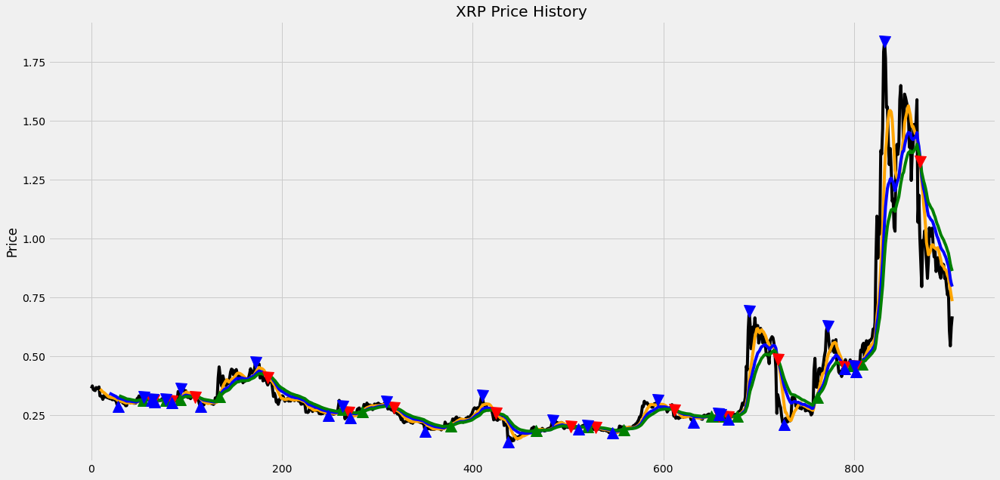

...

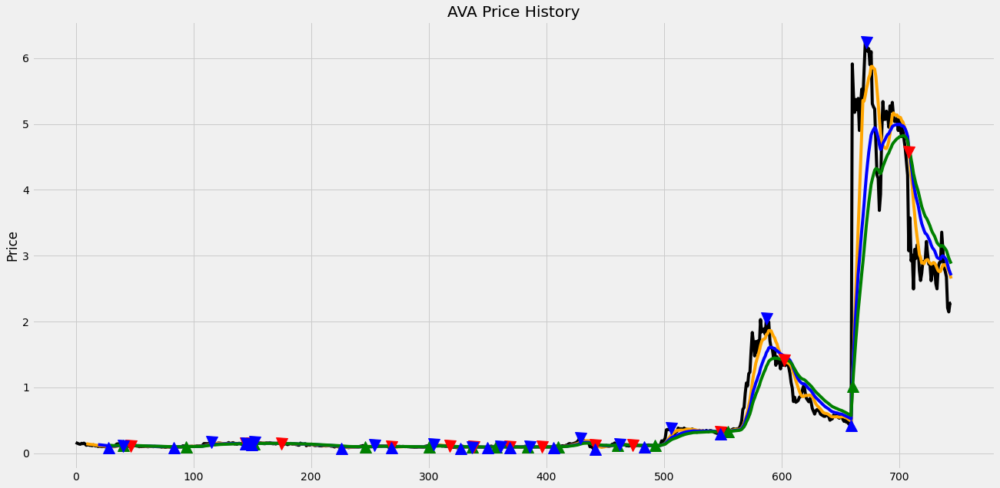

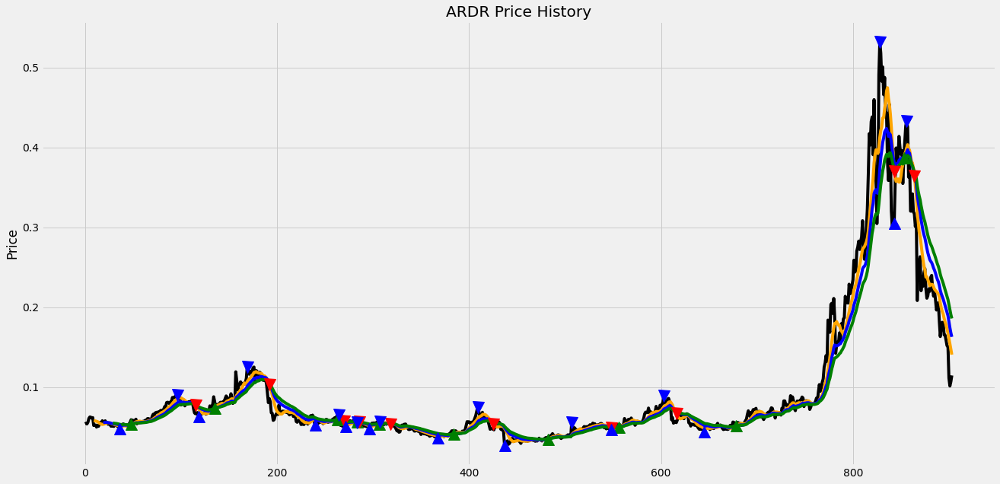

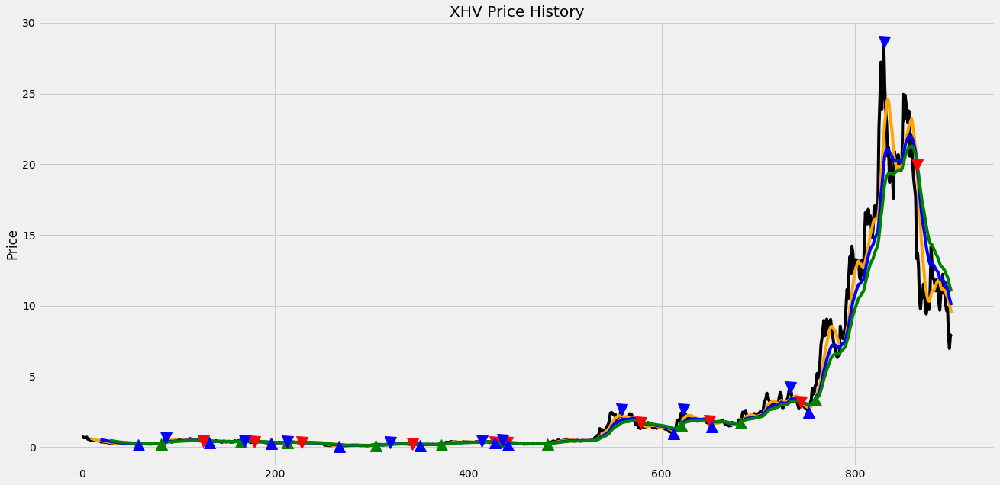

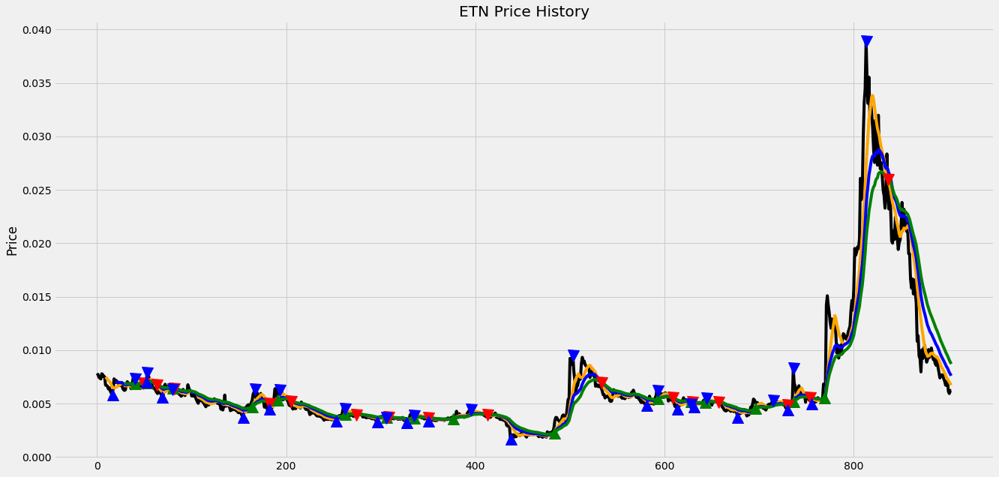

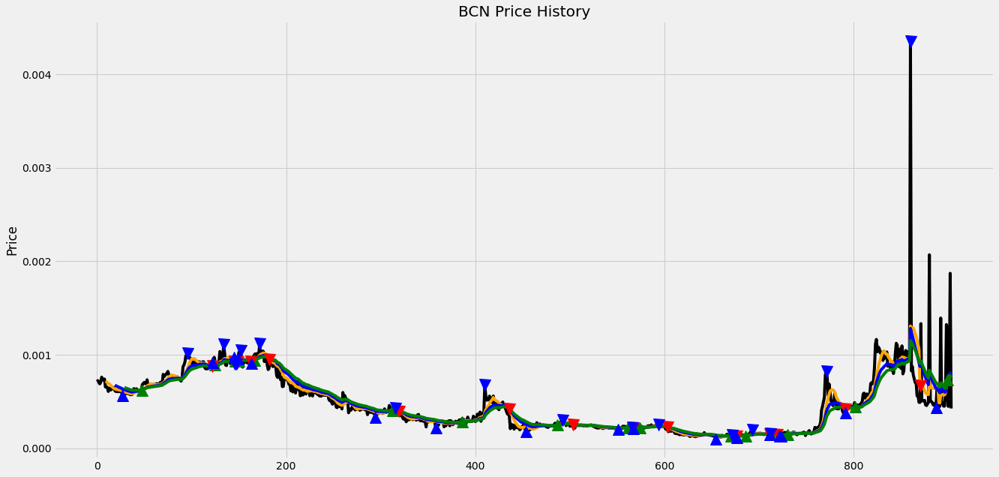

In [41]:
# set configuration variables for pipeline
path = '/Users/steve/coinpix/'                                   # path to files
years=[2019,2020,2021]                                           # years of data to analyze
show_plot = True                                                # boolean flag to show plots
save_result = False                                              # boolean flag to save result
coins = pd.read_csv(path + 'coins.csv',header=None).values[0]    # coins to analyze

# main loop to run for each coin
for coin in coins:
    
    # load price data and add symbol column
    price_df = load_data(coin,years,path + 'price-data')         
    price_df['symbol'] = coin
    
    # find crossover points and inflection points in trend
    signals = get_signals(price_df)                              
    best = get_best(signals)                                     
    
    # show plots if needed
    if show_plot:
        plot_signals(coin, best) 
    
    # save inflection points used in training if needed
    if save_result:
        save_results(coin, price_df, best)